# Prototyping pointilism project
Notebook to prototype turning images in points

In [49]:
import numpy as np
from PIL import Image, ImageDraw
from matplotlib import pyplot as plt
from IPython.display import display

from random import random
from math import sqrt
from math import floor

## Bring in an image

In [124]:
image = Image.open('IMG_0290.jpg')

In [128]:
def crop4by3(image):
    half_the_width = image.size[0] / 2
    half_the_height = image.size[1] / 2
    w = image.size[0]
    h = image.size[1]
    image = image.crop((0,half_the_height - half_the_height*2/3,
                        w,half_the_height + half_the_height*2/3))
    return image

In [129]:
image = crop4by3(image)
image.size

(3968, 1984)

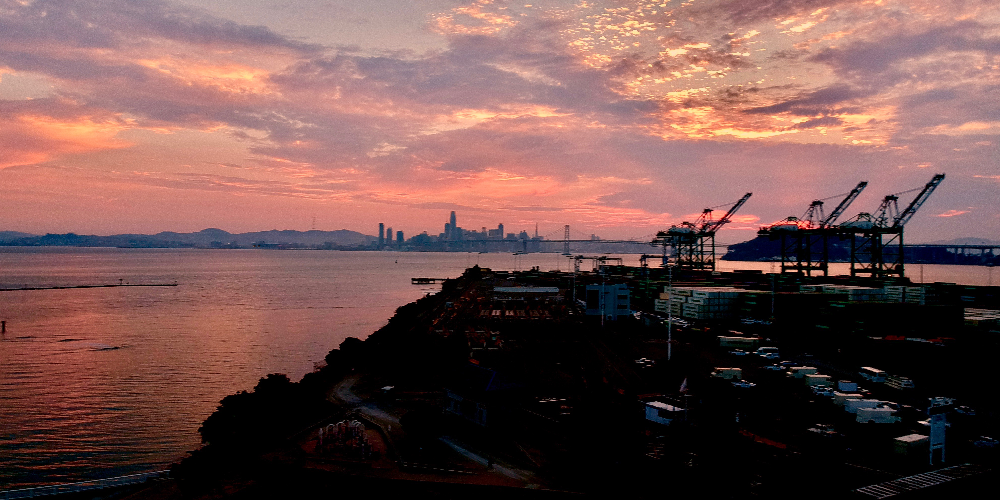

In [130]:
image

In [131]:
# Get np array of image
np_image = np.array(image).astype('float')

## Define functions for simple rectangular plotting

In [132]:
def getColorOfPixel(array, loc, r):
    """Returns RGB tuple [0,255] of average color of the np array
    of an image within a square of width 2r at location loc=[x,y]"""
    left = max(loc[0]-r,0)
    right = min(loc[0]+r,array.shape[1])
    bottom = max(loc[1]-r,0)
    top = min(loc[1]+r,array.shape[0])
    x = range(left,right)
    y = range(bottom,top)
    if len(x) == 0 | len(y) == 0: return (255,255,255)
    R = int(array[np.ix_(y, x, [0])].mean())
    G = int(array[np.ix_(y, x, [1])].mean())
    B = int(array[np.ix_(y, x, [2])].mean())
    #if (np.isnan(R) | np.isnan(G) | np.isnan(B)): R,G,B = 255,255,255
    return (R,G,B)
    

In [133]:
def plotColorPoint(image, array, loc, r):
    """Plots point at loc with size r with average color from 
    same in array"""
    color = getColorOfPixel(array,loc,r)
    draw = ImageDraw.Draw(image)
    w = image.size[0]
    h = image.size[1]
    # Correct for PIL using TL indexing instead of BL
    #draw.ellipse((loc[0]-r, h-(loc[1]+r),loc[0]+r,h-(loc[1]-r)),color + (255,))
    draw.ellipse((loc[0]-r, (loc[1]-r),loc[0]+r,(loc[1]+r)),color + (255,))
   

In [134]:
def plotRecPoints(image, array,r,step, fill):
    """Plots rectangular array of points over an image array,
    if fill is True, fills frame, otherwise leaves border"""
 
    if fill:
        x_step = int(array.shape[1] / floor(array.shape[1]/step+1))
        y_step = int(array.shape[0] / floor(array.shape[0]/step+1))
        for x in range(0,array.shape[1],x_step):
            for y in range(0,array.shape[0],y_step):
                plotColorPoint(array,[x,y],r)
    else:
        x_step = int((array.shape[1]-2*r) / int((array.shape[1]-2*r)/step))
        y_step = int((array.shape[0]-2*r) / int((array.shape[0]-2*r)/step))
        for x in range(r,array.shape[1]-r + x_step,x_step):
            for y in range(r,array.shape[0]-r + y_step,y_step):
                plotColorPoint(image,array,[x,y],r)

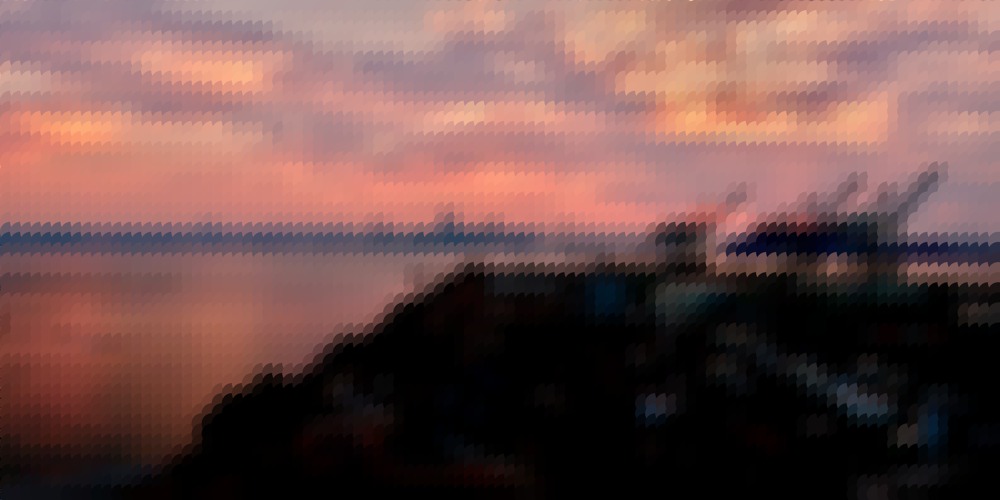

In [135]:
image_out = image.copy()
plotRecPoints(image_out,np_image,40,40,False)
image_out

## Now random plotting

In [136]:
def plotRandomPoints(image, array, n, constant, power):
    """plots random points over image, where constant is
    the portion of the width for the max size of the bubble, 
    and power pushes the distribution towards smaller bubbles"""
    h = array.shape[0]
    w = array.shape[1]
    for i in range(0,n):
        loc = [int(random()*w), int(random()*h)]
        r = int(random()**(power)*w*constant)
        plotColorPoint(image, array,loc,r)

## Bring it together

In [144]:
image_out = image.copy()
plotRecPoints(image_out,np_image,40,40,False)
plotRandomPoints(image_out,np_image,100000,0.01,3)

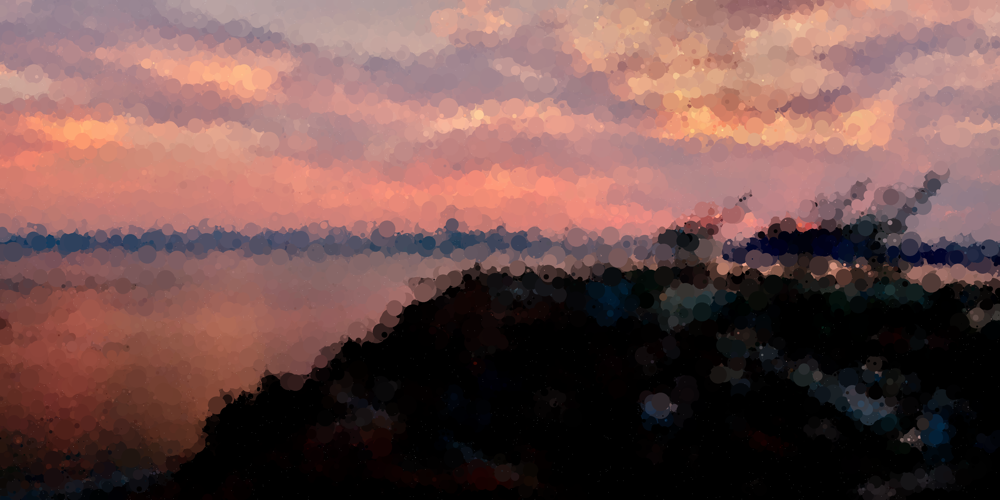

In [145]:
image_out.save('out - 01-3 - power.png')
image_out

## Wrap it up quickly for executing

In [151]:
def pointillismRandom(filename):
    """Takes image and saves pointillized image"""
    print(filename)
    image = Image.open(filename)
    image = crop4by3(image)
    np_image = np.array(image).astype('float')
    fig = plt.figure(figsize=[10,5])
    plotRecPoints(image, np_image,40,40, False)
    plotRandomPoints(image, np_image,100000,0.01,3)
    image.save('out - 01-3 - power.png')
    display(image)
    

images/IMG_0216.jpg


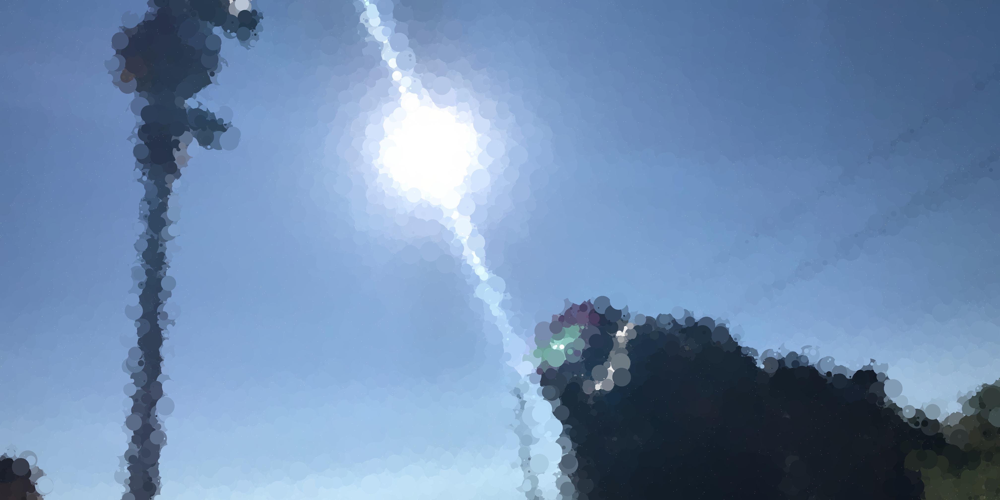

images/IMG_0302.jpg


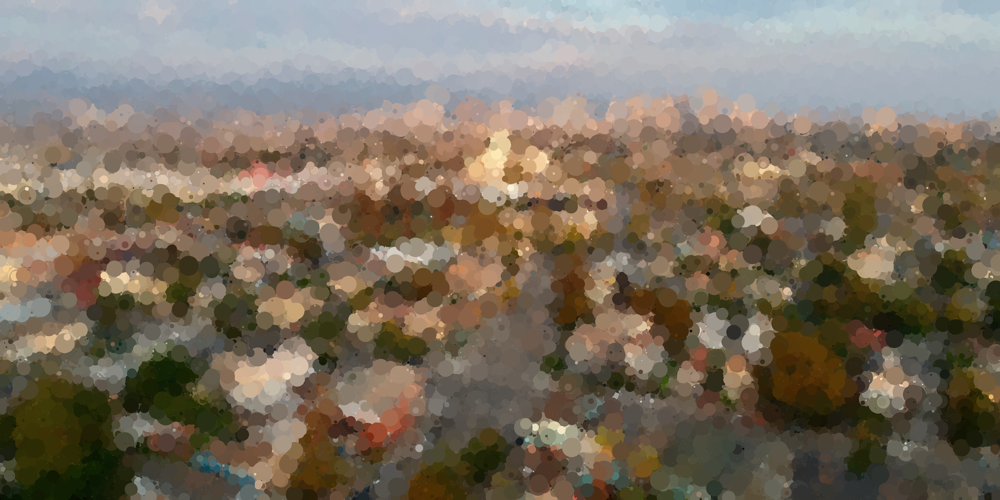

images/IMG_0303.jpg


In [ ]:
import os
for file in os.listdir("images/"):
    if file.endswith(".jpg"):
        pointillismRandom("images/"+file)